In [6]:
import os
import random
import shutil
from pathlib import Path
from typing import List, Optional

from lightning.pytorch.callbacks import ModelCheckpoint, EarlyStopping
from lightning.pytorch import Trainer, seed_everything
from lightning import LightningModule
import rasterio
import segmentation_models_pytorch as smp
import torch
import torch.functional as F
import torch.nn as nn
import torch.optim as optim

from rasterio.windows import Window
from torch.utils.data import DataLoader, Dataset
from torchmetrics.classification import BinaryF1Score
from torchvision.transforms.functional import resize
from tqdm import tqdm

In [7]:
def split_dataset(
    images_dir,
    masks_dir,
    output_dir,
    train_ratio=0.8,
    val_ratio=0.1,
    test_ratio=0.1,
    seed=42,
):
    random.seed(seed)

    assert train_ratio + val_ratio + test_ratio == 1, "invalid ratios"

    Path(output_dir).mkdir(parents=True, exist_ok=True)
    subsets = ["train", "val", "test"]
    for subset in subsets:
        Path(output_dir, subset, "images").mkdir(parents=True, exist_ok=True)
        Path(output_dir, subset, "masks").mkdir(parents=True, exist_ok=True)

    images = sorted(os.listdir(images_dir))
    masks = sorted(os.listdir(masks_dir))
    assert len(images) == len(masks), "images != masks"

    dataset = list(zip(images, masks))
    random.shuffle(dataset)

    total_size = len(dataset)
    train_size = int(total_size * train_ratio)
    val_size = int(total_size * val_ratio)

    train_set = dataset[:train_size]
    val_set = dataset[train_size : train_size + val_size]
    test_set = dataset[train_size + val_size :]

    def copy_files(file_set, subset_name):
        for img_file, mask_file in file_set:
            shutil.copy2(
                os.path.join(images_dir, img_file),
                os.path.join(output_dir, subset_name, "images", img_file),
            )
            shutil.copy2(
                os.path.join(masks_dir, mask_file),
                os.path.join(output_dir, subset_name, "masks", mask_file),
            )

    copy_files(train_set, "train")
    copy_files(val_set, "val")
    copy_files(test_set, "test")

    print(
        f"Dataset split complete. Train: {len(train_set)}, Val: {len(val_set)}, Test: {len(test_set)}"
    )


In [8]:
def get_tiles_with_overlap(
    image_width: int, image_height: int, tile_size: int, overlap: int
) -> List[Window]:
    """
    Calculate the windows for tiles with specified overlap across the image.

    Parameters:
        image_width (int): The width of the input image in pixels.
        image_height (int): The height of the input image in pixels.
        tile_size (int): The size of each tile (assumes square tiles).
        overlap (int): The number of overlapping pixels between adjacent tiles.

    Returns:
        List[Window]: A list of rasterio Window objects representing each tile.
    """
    step_size = tile_size - overlap
    tiles = []
    for y in range(0, image_height, step_size):
        for x in range(0, image_width, step_size):
            window = Window(x, y, tile_size, tile_size)
            # Adjust window if it exceeds the image bounds
            window = window.intersection(
                Window(0, 0, image_width, image_height)
            )
            tiles.append(window)
    return tiles

In [9]:
def save_tile(
    src_dataset: rasterio.io.DatasetReader,
    window: Window,
    output_folder: str,
    tile_index: int,
    image_id: str,
) -> None:
    """
    Extract and save a single tile from the source dataset.

    Parameters:
        src_dataset (rasterio.io.DatasetReader): The opened rasterio dataset (the input image).
        window (Window): The window (rasterio Window object) defining the tile.
        output_folder (str): The folder where the tiles will be saved.
        tile_index (int): Index of the tile to be used for naming the file.
        image_id (int): Image id to be used for naming the file.

    Returns:
        None
    """
    transform = src_dataset.window_transform(window)
    tile_data = src_dataset.read(window=window)

    profile = src_dataset.profile
    profile.update(
        {
            "driver": "GTiff",
            "height": window.height,
            "width": window.width,
            "transform": transform,
        }
    )

    output_filename = os.path.join(
        output_folder, f"tile_{image_id}_{tile_index}.tif"
    )
    with rasterio.open(output_filename, "w", **profile) as dst:
        dst.write(tile_data)

In [10]:
def split_image(
    image_path: str,
    output_folder: str,
    mask_path: Optional[str] = None,
    tile_size: int = 512,
    overlap: int = 128,
    image_id: str = "0",
) -> None:
    """
    Split a large GeoTIFF image and its corresponding mask (if provided) into tiles with overlap
    and save them.

    Parameters:
        image_path (str): The file path of the input TIFF image.
        mask_path (Optional[str]): The file path of the corresponding mask TIFF image. If None, only image is processed.
        output_folder (str): The folder where the tiles will be saved.
        tile_size (int, optional): The size of the tiles. Default is 512x512.
        overlap (int, optional): The number of pixels to overlap between tiles. Default is 128 pixels.
        image_id (int, optional): ID of the input image to be used for naming the file.
            Defaults to 0.

    Returns:
        None
    """
    with rasterio.open(image_path) as src_image:
        image_width = src_image.width
        image_height = src_image.height

        # Create output directories for images and masks (if available)
        images_folder = os.path.join(output_folder, "images")
        os.makedirs(images_folder, exist_ok=True)

        if mask_path:
            masks_folder = os.path.join(output_folder, "masks")
            os.makedirs(masks_folder, exist_ok=True)

        # Get list of tiles with overlap
        tiles = get_tiles_with_overlap(
            image_width, image_height, tile_size, overlap
        )

        # Save image tiles (and mask tiles if provided)
        if mask_path:
            with rasterio.open(mask_path) as src_mask:
                for idx, window in tqdm(enumerate(tiles)):
                    save_tile(src_image, window, images_folder, idx, image_id)
                    save_tile(src_mask, window, masks_folder, idx, image_id)
        else:
            for idx, window in tqdm(enumerate(tiles)):
                save_tile(src_image, window, images_folder, idx, image_id)

In [11]:
seed_everything(42, workers=True)

Seed set to 42


42

In [7]:
for filename in os.listdir("./train/images/"):
    image_id, _ = filename.split(".")
    image_path = f"./train/images/{filename}"
    mask_path = f"./train/masks/{filename}"

    output_folder = "./data/"

    split_image(
        image_path=image_path,
        mask_path=mask_path,
        output_folder=output_folder,
        tile_size=512,
        overlap=64,
        image_id=image_id,
    )


0it [00:00, ?it/s]

48it [00:00, 57.78it/s]
288it [00:04, 60.58it/s]
552it [00:08, 63.78it/s]
96it [00:01, 72.90it/s]
4it [00:00, 101.03it/s]
4it [00:00, 103.94it/s]
288it [00:04, 68.64it/s]
150it [00:02, 68.36it/s]


In [12]:
def remove_images_with_empty_masks(
    images_dir, masks_dir, threshold=0.01
) -> None:
    removed_count = 0
    for filename in tqdm(os.listdir(images_dir)):
        image_path = os.path.join(images_dir, filename)
        mask_path = os.path.join(masks_dir, filename)

        with rasterio.open(mask_path) as mask_source:
            mask = mask_source.read(1).astype("float32")

        mask = torch.tensor(mask)

        mask_size = mask.numel()
        non_zero_count = mask.count_nonzero().item()

        if non_zero_count / mask_size < threshold:
            os.remove(image_path)
            os.remove(mask_path)
            removed_count += 1
    print(f"removed {removed_count} images")

In [9]:
remove_images_with_empty_masks("./data/images", "./data/masks")

100%|██████████| 1430/1430 [00:04<00:00, 323.33it/s]

removed 1068 images


In [10]:
images_dir = "./data/images"
masks_dir = "./data/masks"
output_dir = "./dataset"

split_dataset(images_dir, masks_dir, output_dir)

Dataset split complete. Train: 289, Val: 36, Test: 37


In [32]:
class SemanticSegmentationDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None, target_size=512):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.target_size = target_size
        self.image_files = sorted(os.listdir(images_dir))
        self.mask_files = sorted(os.listdir(masks_dir)) if masks_dir else []

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.images_dir, self.image_files[idx])
        if self.masks_dir:
            mask_path = os.path.join(self.masks_dir, self.mask_files[idx])

        try:
            # Load image and mask
            with rasterio.open(image_path) as img:
                image = img.read().astype(
                    "float32"
                )  # shape: (channels, height, width)
            if self.masks_dir:
                with rasterio.open(mask_path) as msk:
                    mask = msk.read(1).astype(
                        "float32"
                    )  # shape: (height, width)
        except Exception as e:
            print(f"Error loading {image_path} or {mask_path}: {e}")
            return None  # Skip this item if an error occurs

        # Convert to torch tensors
        image = torch.tensor(image)
        if self.masks_dir:
            mask = torch.tensor(mask)

        image /= 10000.0
        image = torch.clamp(image, 0.0, 1.0)

        # Resize if either dimension is too small
        channels, height, width = image.shape

        padded_image = torch.zeros(channels, self.target_size, self.target_size)
        padded_image[:, :height, :width] = image

        if self.masks_dir:
            padded_mask = torch.zeros(1, self.target_size, self.target_size)
            padded_mask[:, :height, :width] = mask
        else:
            padded_mask = np.array([])

        if self.transform:
            padded_image, padded_mask = self.transform(
                padded_image, padded_mask
            )

        return (
            padded_image,
            padded_mask,
            self.image_files[idx],
        )  # Return file name for saving

In [14]:
def create_dataloaders() -> tuple[DataLoader, DataLoader]:
    train_images_dir = "./dataset/train/images"
    train_masks_dir = "./dataset/train/masks"
    val_images_dir = "./dataset/val/images"
    val_masks_dir = "./dataset/val/masks"

    train_dataset = SemanticSegmentationDataset(
        train_images_dir, train_masks_dir, transform=None
    )
    val_dataset = SemanticSegmentationDataset(
        val_images_dir, val_masks_dir, transform=None
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=4,
        shuffle=True,
        num_workers=3,
        persistent_workers=True,
    )
    val_loader = DataLoader(
        val_dataset,
        batch_size=4,
        shuffle=False,
        num_workers=3,
        persistent_workers=True,
    )

    return train_loader, val_loader

In [15]:
class GAN(LightningModule):
    def __init__(self, lr1=0.0001, lr2=0.0002, beta1=0.3, beta2=0.2):
        super(GAN, self).__init__()
        self.save_hyperparameters()

        # Generator (U-Net)
        self.generator = smp.Unet(
            encoder_name="resnet50",
            encoder_weights="imagenet",
            in_channels=10,
            classes=1,
            activation="sigmoid",
        )

        # Discriminator
        self.discriminator = self._build_discriminator()

        # Loss functions
        self.adv_loss = nn.BCELoss()
        self.pixelwise_loss = nn.BCEWithLogitsLoss()

        self.automatic_optimization = False

    def _build_discriminator(self):
        # Custom discriminator as per user requirement
        return nn.Sequential(
            nn.Conv2d(11, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        # Generate segmentation mask
        return self.generator(x)

    def generator_step(self, real_images, real_masks):
        # Generate fake mask
        fake_masks = self(real_images)

        # Discriminator wants fake to be classified as "real"
        fake_input = torch.cat((real_images, fake_masks), dim=1)
        fake_pred = self.discriminator(fake_input)

        # Calculate adversarial and pixel-wise loss
        adversarial_loss = self.adv_loss(fake_pred, torch.ones_like(fake_pred))
        pixel_loss = self.pixelwise_loss(fake_masks, real_masks)

        # Total generator loss
        g_loss = adversarial_loss + pixel_loss
        return g_loss

    def discriminator_step(self, real_images, real_masks, fake_masks):
        # Real mask
        real_input = torch.cat((real_images, real_masks), dim=1)
        real_pred = self.discriminator(real_input)
        real_loss = self.adv_loss(real_pred, torch.ones_like(real_pred))

        # Fake mask
        fake_input = torch.cat((real_images, fake_masks.detach()), dim=1)
        fake_pred = self.discriminator(fake_input)
        fake_loss = self.adv_loss(fake_pred, torch.zeros_like(fake_pred))

        # Total discriminator loss
        d_loss = (real_loss + fake_loss) / 2
        return d_loss

    def training_step(self, batch, batch_idx):
        real_images, real_masks, _ = batch

        opt_g, opt_d = self.optimizers()

        # Generator step
        g_loss = self.generator_step(real_images, real_masks)
        self.manual_backward(g_loss)
        opt_g.step()
        opt_g.zero_grad()

        # Discriminator step
        fake_masks = self(real_images)
        d_loss = self.discriminator_step(real_images, real_masks, fake_masks)
        self.manual_backward(d_loss)
        opt_d.step()
        opt_d.zero_grad()

        self.log(
            "train/g_loss", g_loss, prog_bar=True, on_step=True, on_epoch=True
        )
        self.log(
            "train/d_loss", d_loss, prog_bar=True, on_step=True, on_epoch=True
        )

    def validation_step(self, batch, batch_idx, *args, **kwargs):
        real_images, real_masks, _ = batch
        g_loss = self.generator_step(real_images, real_masks)

        fake_masks = self(real_images)
        d_loss = self.discriminator_step(real_images, real_masks, fake_masks)

        self.log(
            "val/g_loss", g_loss, prog_bar=True, on_step=True, on_epoch=True
        )
        self.log(
            "val/d_loss", d_loss, prog_bar=True, on_step=True, on_epoch=True
        )

    def test_step(self, batch, batch_idx, *args, **kwargs):
        real_images, real_masks, _ = batch

        fake_masks = self(real_images)

        discriminator_real_input = torch.cat((real_images, real_masks), dim=1)
        discriminator_real_output = self.discriminator(discriminator_real_input)

        discriminator_fake_input = torch.cat(
            (real_images, fake_masks.detach()), dim=1
        )
        discriminator_fake_output = self.discriminator(discriminator_fake_input)

        discriminator_ideal_output = torch.cat(
            (
                torch.ones_like(discriminator_real_output),
                torch.zeros_like(discriminator_fake_output),
            ),
            dim=1,
        )
        discriminator_output = torch.cat(
            (discriminator_real_output, discriminator_fake_output), dim=1
        )

        metric = BinaryF1Score(multidim_average="samplewise")

        generator_f1 = metric(fake_masks, real_masks)
        discriminator_f1 = metric(
            discriminator_output, discriminator_ideal_output
        )

        self.log(
            "test/g_f1",
            generator_f1.mean(),
            prog_bar=True,
            on_step=True,
            on_epoch=True,
        )
        self.log(
            "test/d_f1",
            discriminator_f1.mean(),
            prog_bar=True,
            on_step=True,
            on_epoch=True,
        )

    def predict_step(self, batch, batch_idx):
        real_images, *_ = batch
        return self(real_images)

    def configure_optimizers(self):
        # Optimizers for generator and discriminator
        opt_g = optim.Adam(
            self.generator.parameters(),
            lr=self.hparams.lr1,
            betas=(self.hparams.beta1, self.hparams.beta2),
        )
        opt_d = optim.Adam(
            self.discriminator.parameters(),
            lr=self.hparams.lr2,
            betas=(self.hparams.beta1, self.hparams.beta2),
        )

        return [opt_g, opt_d], []


In [16]:
train_dataloader, val_dataloader = create_dataloaders()

checkpoint_callback = ModelCheckpoint(dirpath="./checkpoints/")
early_stopping = EarlyStopping("val/g_loss", patience=6)

model = GAN()
trainer = Trainer(
    max_epochs=20, callbacks=[checkpoint_callback, early_stopping]
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/user1/environments/hack/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


In [13]:
trainer.fit(model, train_dataloader, val_dataloader)

/home/user1/environments/hack/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /home/user1/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type              | Params | Mode 
-------------------------------------------------------------
0 | generator      | Unet              | 32.5 M | train
1 | discriminator  | Sequential        | 1.6 M  | train
2 | adv_loss       | BCELoss           | 0      | train
3 | pixelwise_loss | BCEWithLogitsLoss | 0      | train
-------------------------------------------------------------
34.1 M    Trainable params
0         Non-trainable params
34.1 M    Total params
136.421   Total estimated model params size (MB)
240       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/user1/environments/hack/lib/python3.10/site-packages/lightning/pytorch/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: |          | 0/? [00:00<?, ?it/s]

/home/user1/environments/hack/lib/python3.10/site-packages/lightning/pytorch/utilities/data.py:78: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [17]:
model = GAN.load_from_checkpoint("checkpoints/epoch=14-step=2190.ckpt")

In [18]:
test_dataset = SemanticSegmentationDataset(
    "./dataset/test/images", "./dataset/test/masks", transform=None
)

test_loader = DataLoader(
    test_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=3,
    persistent_workers=True,
)

In [49]:
prediction = torch.cat(trainer.predict(model, test_loader), dim=0)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [30]:
def inference(dataloader, trainer, model, output_path="./results"):
    os.makedirs(output_path, exist_ok=True)

    predictions = torch.cat(trainer.predict(model, dataloader), dim=0)
    predictions[predictions >= 0.5] = 1.0
    predictions[predictions < 0.5] = 0.0
    predictions = predictions.int() * 255

    original_filenames = []

    for item in dataloader:
        *_, filenames = item
        original_filenames.extend(filenames)

    for prediction, filename in zip(predictions, original_filenames):
        prediction = prediction.squeeze(0).cpu().numpy()

        with rasterio.open(f"./test_data/images/{filename}") as src:
            profile = src.profile
            src_shape = src.read(1).shape

        prediction = prediction[: src_shape[0], : src_shape[1]]

        with rasterio.open(
            os.path.join(output_path, filename),
            "w",
            driver="GTiff",
            width=src_shape[1],
            height=src_shape[0],
            count=1,
            dtype=prediction.dtype,
            crs=profile["crs"],
            transform=profile["transform"],
        ) as dst:
            dst.write(prediction, 1)

In [20]:
inference(test_loader, trainer, model, "./results2")

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [21]:
import numpy as np


def normalize(band):
    band_min, band_max = (band.min(), band.max())
    return (band - band_min) / (band_max - band_min)

In [22]:
def brighten(band):
    alpha = 0.13
    beta = 0
    return np.clip(alpha * band + beta, 0, 255)

In [23]:
def convert(im_path):
    with rasterio.open(im_path) as fin:
        red = fin.read(3)
        green = fin.read(2)
        blue = fin.read(1)

    red_b = brighten(red)
    blue_b = brighten(blue)
    green_b = brighten(green)

    red_bn = normalize(red_b)
    green_bn = normalize(green_b)
    blue_bn = normalize(blue_b)

    return np.dstack((blue_b, green_b, red_b)), np.dstack(
        (red_bn, green_bn, blue_bn)
    )

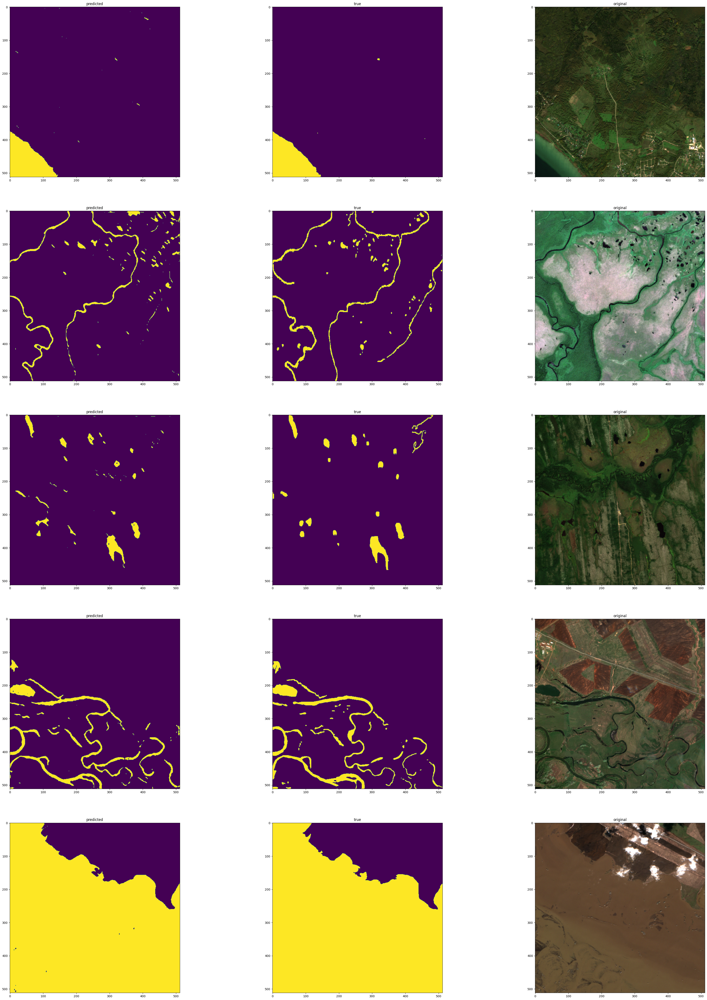

In [24]:
import matplotlib.pyplot as plt

figure, axes = plt.subplots(
    len(os.listdir("./results2")[:5]), 3, figsize=(45, 60)
)

for i, filename in enumerate(os.listdir("./results2")[:5]):
    original_image = convert(f"./data/images/{filename}")[1]

    with rasterio.open(f"./results2/{filename}") as file:
        predicted_mask = file.read(1)

    with rasterio.open(f"./data/masks/{filename}") as file:
        true_mask = file.read(1)

    axes[i, 0].imshow(predicted_mask)
    axes[i, 0].set_title("predicted")
    axes[i, 1].imshow(true_mask)
    axes[i, 1].set_title("true")
    axes[i, 2].imshow(original_image)
    axes[i, 2].set_title("original")

plt.show()

In [45]:
def merge_tiles(
    tiles_folder: str,
    output_path: str,
    tile_size: int = 512,
    overlap: int = 128,
    id: str = "1",
) -> None:
    """
    Merge image tiles into a single GeoTIFF file, considering overlapping regions.

    Parameters:
        tiles_folder (str): The folder containing the image tiles to be merged.
        output_path (str): The file path of the output merged GeoTIFF.
        tile_size (int, optional): The size of the tiles. Default is 512x512.
        overlap (int, optional): The number of pixels that overlap between tiles. Default is 128 pixels.

    Returns:
        None
    """
    print(os.listdir(tiles_folder))

    # Gather all tile files in the folder
    tile_files = [
        os.path.join(tiles_folder, file_name)
        for file_name in os.listdir(tiles_folder)
        if file_name.split("_")[1].startswith(id)
    ]

    print(tile_files)

    # Open all tiles with rasterio and add them to the list of sources
    sources = [rasterio.open(tile_file) for tile_file in tile_files]

    # Determine the bounds of the final merged image
    min_x, min_y, max_x, max_y = None, None, None, None
    for src in sources:
        bounds = src.bounds
        min_x = bounds.left if min_x is None else min(min_x, bounds.left)
        min_y = bounds.bottom if min_y is None else min(min_y, bounds.bottom)
        max_x = bounds.right if max_x is None else max(max_x, bounds.right)
        max_y = bounds.top if max_y is None else max(max_y, bounds.top)

    # Calculate the shape of the merged image, considering tile size and overlap
    pixel_size_x = sources[0].transform[0]
    pixel_size_y = -sources[0].transform[4]
    merged_width = int((max_x - min_x) / pixel_size_x)
    merged_height = int((max_y - min_y) / pixel_size_y)
    merged_transform = rasterio.transform.from_origin(
        min_x, max_y, pixel_size_x, pixel_size_y
    )

    # Create arrays to hold the merged data and the count of contributions
    merged_data = np.zeros(
        (sources[0].count, merged_height, merged_width), dtype=np.float32
    )
    count_data = np.zeros((merged_height, merged_width), dtype=np.float32)

    # Iterate over each source and add its data to the merged arrays, considering tile size and overlap
    for src in sources:
        tile_data = src.read()
        col_off = int((src.bounds.left - min_x) / pixel_size_x)
        row_off = int((max_y - src.bounds.top) / pixel_size_y)
        height, width = tile_data.shape[1], tile_data.shape[2]

        # Adjust for overlap and tile size
        row_start = max(0, row_off)
        row_end = min(merged_height, row_off + tile_size)
        col_start = max(0, col_off)
        col_end = min(merged_width, col_off + tile_size)

        tile_row_end = min(height, row_end - row_start)
        tile_col_end = min(width, col_end - col_start)

        merged_data[
            :,
            row_start : row_start + tile_row_end,
            col_start : col_start + tile_col_end,
        ] += tile_data[:, :tile_row_end, :tile_col_end]
        count_data[
            row_start : row_start + tile_row_end,
            col_start : col_start + tile_col_end,
        ] += 1

    # Avoid black lines by averaging overlapping pixels
    count_data[count_data == 0] = 1
    merged_data = (merged_data / count_data).astype(np.uint8)
    merged_data = np.where(merged_data >= 127.5, 255, 0).astype(np.uint8)

    # Use the profile from the first tile to set up the output file
    profile = sources[0].profile
    profile.update(
        {
            "height": merged_height,
            "width": merged_width,
            "transform": merged_transform,
            "dtype": "uint8",
            "count": merged_data.shape[0],
            "bounds": (min_x, min_y, max_x, max_y),
            "crs": sources[0].crs,
        }
    )

    # Write the merged data to the output file
    with rasterio.open(output_path, "w", **profile) as dst:
        dst.write(merged_data)

    # Close all source files
    for src in sources:
        src.close()


In [26]:
for filename in os.listdir("./test_dataset_test_scoltech/test_scoltech/images"):
    image_id, _ = filename.split(".")
    image_path = f"./test_dataset_test_scoltech/test_scoltech/images/{filename}"

    output_folder = "./test_data/"

    split_image(
        image_path=image_path,
        output_folder=output_folder,
        tile_size=512,
        overlap=64,
        image_id=image_id,
    )

72it [00:01, 66.58it/s]
72it [00:00, 78.24it/s]
66it [00:00, 76.73it/s]
66it [00:00, 80.38it/s]


In [33]:
test_dataset = SemanticSegmentationDataset(
    "./test_data/images", None, transform=None
)

test_loader = DataLoader(
    test_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=3,
    persistent_workers=True,
)

In [34]:
inference(test_loader, trainer, model, "./results_test")

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

In [51]:
for _id in map(str, range(1, 5)):
    merge_tiles(
        "./results_test/", f"./results_merged/{_id}.tif", overlap=64, id=_id
    )

['tile_1_39.tif', 'tile_4_45.tif', 'tile_4_16.tif', 'tile_4_0.tif', 'tile_4_43.tif', 'tile_1_27.tif', 'tile_3_54.tif', 'tile_3_64.tif', 'tile_2_69.tif', 'tile_2_70.tif', 'tile_1_30.tif', 'tile_1_29.tif', 'tile_2_61.tif', 'tile_1_21.tif', 'tile_4_13.tif', 'tile_3_24.tif', 'tile_4_56.tif', 'tile_3_34.tif', 'tile_3_52.tif', 'tile_2_26.tif', 'tile_2_34.tif', 'tile_1_37.tif', 'tile_3_9.tif', 'tile_3_43.tif', 'tile_1_1.tif', 'tile_3_17.tif', 'tile_1_7.tif', 'tile_3_31.tif', 'tile_3_14.tif', 'tile_4_30.tif', 'tile_3_35.tif', 'tile_4_20.tif', 'tile_4_40.tif', 'tile_2_43.tif', 'tile_2_23.tif', 'tile_2_56.tif', 'tile_3_29.tif', 'tile_1_58.tif', 'tile_4_34.tif', 'tile_3_36.tif', 'tile_2_3.tif', 'tile_2_41.tif', 'tile_1_44.tif', 'tile_3_7.tif', 'tile_1_60.tif', 'tile_4_23.tif', 'tile_4_49.tif', 'tile_1_71.tif', 'tile_4_22.tif', 'tile_4_24.tif', 'tile_4_47.tif', 'tile_1_22.tif', 'tile_3_32.tif', 'tile_2_55.tif', 'tile_4_60.tif', 'tile_1_4.tif', 'tile_2_53.tif', 'tile_3_4.tif', 'tile_2_13.tif', 'til

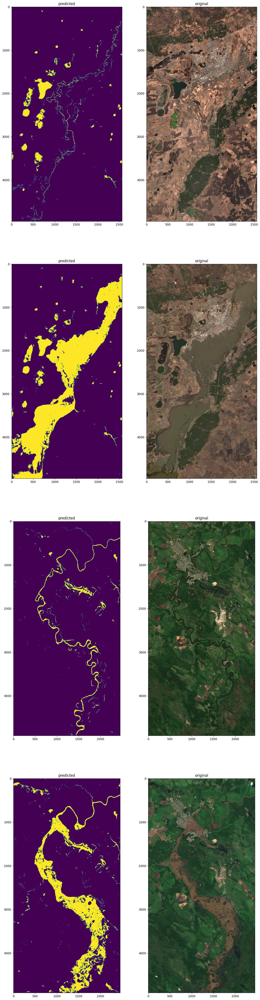

In [54]:
import matplotlib.pyplot as plt

figure, axes = plt.subplots(
    len(os.listdir("./results_merged")), 2, figsize=(15, 60)
)

for i, filename in enumerate(os.listdir("./results_merged")):
    original_image = convert(
        f"./test_dataset_test_scoltech/test_scoltech/images/{filename}"
    )[1]

    with rasterio.open(f"./results_merged/{filename}") as file:
        predicted_mask = file.read(1)

    axes[i, 0].imshow(predicted_mask)
    axes[i, 0].set_title("predicted")
    axes[i, 1].imshow(original_image)
    axes[i, 1].set_title("original")

plt.show()

In [57]:
import shutil

shutil.make_archive("sln", "zip", "results_merged")

'/home/user1/sln.zip'

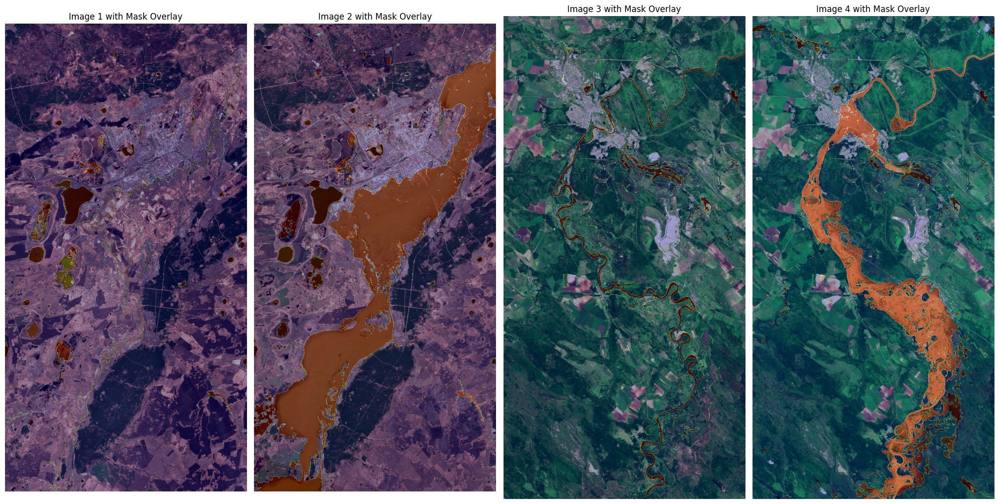

In [59]:
import matplotlib.pyplot as plt
import numpy as np
import rasterio


def load_and_display_images_with_overlay(num_images):
    fig, axes = plt.subplots(1, num_images, figsize=(5 * num_images, 10))

    for i in range(num_images):
        # Paths for the BGR image and mask, using {i+1} in filenames
        bgr_path = (
            f"./test_dataset_test_scoltech/test_scoltech/images/{i+1}.tif"
        )
        mask_path = f"./results_merged/images/{i+1}.tif"

        # Load BGR image and reorder to RGB
        with rasterio.open(bgr_path) as src:
            if src.count < 3:
                print(f"Image {bgr_path} does not have 3 bands for BGR.")
                continue

            # Read BGR channels and reorder to RGB
            bgr_image = src.read([1, 2, 3])
            rgb_image = np.transpose(
                bgr_image, (1, 2, 0)
            )  # Transpose to (H, W, C)
            rgb_image = rgb_image[:, :, ::-1]  # Reorder BGR to RGB

            # Apply percentile clipping for better visualization
            lower_percentile, upper_percentile = np.percentile(
                rgb_image, (2, 98)
            )
            rgb_image = np.clip(rgb_image, lower_percentile, upper_percentile)
            rgb_image = (
                (rgb_image - lower_percentile)
                / (upper_percentile - lower_percentile)
                * 255
            ).astype(np.uint8)

        # Load mask
        with rasterio.open(mask_path) as src:
            mask = src.read(1)  # Assuming the mask is a single-channel image

        # Plot RGB image with overlayed mask
        axes[i].imshow(rgb_image)
        axes[i].imshow(
            mask, cmap="jet", alpha=0.4
        )  # Overlay mask with transparency
        axes[i].set_title(f"Image {i+1} with Mask Overlay")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()


# Call the function with the number of image-mask pairs you want to display
load_and_display_images_with_overlay(num_images=4)
